In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from scipy import interpolate
import os
import scipy.stats
import networkx as nx
from sklearn import metrics
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import radius_neighbors_graph
import matplotlib.patches as mpatches
import sklearn.neighbors
from scipy.spatial import distance
from skimage.filters import unsharp_mask
from skimage.color import rgb2gray
from mpl_toolkits.axes_grid1 import ImageGrid
from collections import Counter
import skimage
from Bio import SeqIO
from Bio.KEGG import REST
from Bio.KEGG.KGML import KGML_parser
import io
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, segmentation, feature, future
from sklearn.ensemble import RandomForestClassifier
from functools import partial

from mpl_toolkits.mplot3d import Axes3D



In [2]:
imDir = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/images/lowres/"


lowres = {}

for f in os.listdir(imDir):
    if f.endswith("png"):
        fullpath = f"{imDir}{f}"
        img = skimage.io.imread(fullpath, as_gray=True)
        key = f.replace(".png", "")
        print(key, img.shape)
        lowres[key] = img

scalefactors = {
    'ND' : 0.050684236,
    'HFD8' : 0.051089484,
    'HFD14' : 0.04912436
}

print('done')

HFD14 (2000, 1628)
ND (2000, 1681)
HFD8 (2000, 1692)
done


In [3]:
fPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/LR/LewisLabUSCS/Mouse/Mouse-2020-Baccin-LR-pairs.xlsx"

lr = pd.read_excel(fPath)
print(lr.shape)

lr['ligand'] = lr['Ligand.Mouse'].str.upper()
lr['receptor'] = lr['Receptor.Mouse'].str.upper()
lr.head()

(2000, 8)


,Pair.Name,Ligand.Mouse,Receptor.Mouse,Source,ManualAnnotation,Ligand.CC,Ligand.GO,Reference (PMID / KEGG),ligand,receptor
0,A2m-Lrp1,A2m,Lrp1,Ramilowski,Correct,Secreted,Other,"1702392,10652313, 12194978",A2M,LRP1
1,Adgre5-Cd55,Adgre5,Cd55,Baccin,Correct,Membrane,Other,23447688,ADGRE5,CD55
2,Adipoq-Adipor1,Adipoq,Adipor1,Ramilowski,Correct,Secreted,Other,12802337,ADIPOQ,ADIPOR1
3,Adipoq-Adipor2,Adipoq,Adipor2,Ramilowski,Correct,Secreted,Other,"12802337, 12802330",ADIPOQ,ADIPOR2
4,Adm-Calcrl&Ramp2,Adm,Calcrl&Ramp2,Baccin,Correct,Secreted,Other,10342881,ADM,CALCRL&RAMP2


In [4]:
cardDir =  "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/CARDInputs/"
xyPath =  "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/combinedEmbedding.csv"
xy = pd.read_csv(xyPath)
cTypes = sorted(list(xy['cellTypes'].unique()))
print(cTypes)
print()

keys = ['ND', 'HFD8', 'HFD14']

rna = {}
labels = {}

for key in keys:
    labelPath = f"{cardDir}{key}_macrophage_clusters.csv"
    lf = pd.read_csv(labelPath)
    
    lf = pd.merge(lf, xy[['x', 'y', 'cellId', 'colors']], 
                  how='left',
                  left_on='cellId',
                  right_on='cellId')
    
    labels[key] = lf
    
    rnaPath = f"{cardDir}{key}_macrophage_rna.csv"
    rf = pd.read_csv(rnaPath)
    rf = rf.T
    new_header = rf.iloc[0] 
    rf = rf[1:] 
    rf.columns = new_header 
    rf.index.names = ['cellId']
    
    rna[key] = rf

print('done')

['B cells', 'Dendritic cells', 'Macrophages', 'Monocytes', 'NK cells', 'Stromal cells', 'T cells']

done


,key,Condition,N,percTotal,Mac1,Mac3,Mac4,Mac2,Mac5
0,ND,Macrophages,359,1.000000,0.378830,0.501393,0.041783,0.069638,0.011142
1,ND,Trem2,119,0.331476,0.689076,0.058824,0.092437,0.126050,0.033613
2,ND,Trem2Itgax,15,0.041783,0.133333,0.133333,0.466667,0.133333,0.133333
3,HFD8,Macrophages,2188,1.000000,0.145338,0.237660,0.281536,0.185558,0.152651
4,HFD8,Trem2,1295,0.591865,0.147490,0.074903,0.432432,0.090347,0.257915
5,HFD8,Trem2Itgax,592,0.270567,0.027027,0.092905,0.396959,0.045608,0.444257
6,HFD14,Macrophages,3884,1.000000,0.131308,0.014676,0.363800,0.009269,0.483265
7,HFD14,Trem2,3660,0.942327,0.114481,0.010383,0.359290,0.005464,0.512842
8,HFD14,Trem2Itgax,1406,0.361998,0.013514,0.010669,0.197724,0.003556,0.778094


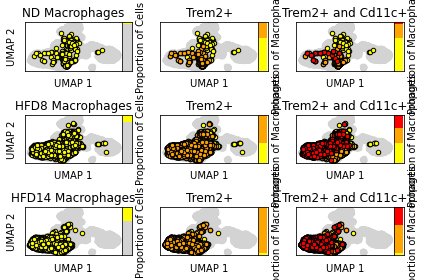

In [5]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.facecolor'] = "w"
plt.rcParams['figure.figsize'] = 11, 9

res = []

fig, axs = plt.subplots(3, 3)


for i, key in enumerate(keys):
    rf = rna[key]
    lf = labels[key]
    
    mask = (xy['cellTypes'] == 'Macrophages') & (xy['key'] == key)
    
    # plot macoprophages
    axs[i, 0].scatter(xy['x'][mask], 
                      xy['y'][mask], 
                      ec='k',
                      s=20,
                      c='yellow', 
                      zorder=2)
    
    # plot non macoprophages
    axs[i, 0].scatter(xy['x'][~mask], 
                      xy['y'][~mask], 
                      ec='lightgrey',
                      c='lightgrey', 
                      s=20,
                      zorder=1)
    
    axs[i, 0].set_yticks([])
    axs[i, 0].set_xticks([])
    axs[i, 0].set_ylabel("UMAP 2")
    axs[i, 0].set_xlabel("UMAP 1")
    axs[i, 0].set_title(f"{key} Macrophages")
    
    ax_divider = make_axes_locatable(axs[i, 0])
    ax2 = ax_divider.append_axes("right", 
                                 size="10%", 
                                 pad=f"0%")
    
    
    bottom = len(mask) - mask.sum()
    ax2.bar("prop", 
            bottom, 
            color="lightgrey")
    
    ax2.bar("prop", 
            mask.sum(), 
            color="yellow",
            bottom=bottom)
    
    ax2.set_ylim([0, len(mask)])
    ax2.set_yticks([])
    ax2.set_ylabel("Proportion of Cells")
    ax2.yaxis.set_label_position("right")
    ax2.set_xticks([])

    """ plot TREM2+ macrophages """
    tremPos = rf['TREM2'].astype(bool)
    tremPosIds = (tremPos > 0)
    tremPosIds = rf[tremPosIds].index.to_list()
    newMask = (xy['cellTypes'] == 'Macrophages') & (xy['key'] == key) & (xy['cellId'].isin(tremPosIds))
        
    axs[i, 1].scatter(xy['x'][newMask], 
                      xy['y'][newMask], 
                      ec='k',
                      c='orange', 
                      s=20,
                      zorder=3)
    
    axs[i, 1].scatter(xy['x'][mask], 
                      xy['y'][mask], 
                      ec='k',
                      c='yellow', 
                      s=20,
                      zorder=2)
    
    axs[i, 1].scatter(xy['x'][~mask], 
                      xy['y'][~mask], 
                      ec='lightgrey',
                      c='lightgrey', 
                      s=20,
                      zorder=1)
    
    axs[i, 1].set_yticks([])
    axs[i, 1].set_xticks([])
    axs[i, 1].set_xlabel("UMAP 1")
    axs[i, 1].set_title(f"Trem2+")
    
    
    ax_divider = make_axes_locatable(axs[i, 1])
    ax2 = ax_divider.append_axes("right", 
                                 size="10%", 
                                 pad=f"0%")
    
    bottom = mask.sum() - newMask.sum()
    ax2.bar("prop", 
            bottom, 
            color="yellow")
    
    ax2.bar("prop", 
            newMask.sum(), 
            color="orange",
            bottom=bottom)
    
    ax2.set_ylim([0, mask.sum()])
    ax2.set_yticks([])
    ax2.set_ylabel("Proportion of Macrophages")
    ax2.yaxis.set_label_position("right")
    ax2.set_xticks([])
    
    
    """ plot TREM2+ macrophages """
    Pos = rf[['ITGAX', 'TREM2']].astype(bool).sum(axis=1)
    posIds = (Pos > 1)
    
    posIds = rf[posIds].index.to_list()
    
    newnewMask = (xy['cellTypes'] == 'Macrophages') & (xy['key'] == key) & (xy['cellId'].isin(posIds))
        
    axs[i, 2].scatter(xy['x'][newnewMask], 
                      xy['y'][newnewMask], 
                      ec='k',
                      c='r', 
                      s=20,
                      zorder=4)
    
    axs[i, 2].scatter(xy['x'][newMask], 
                      xy['y'][newMask], 
                      ec='k',
                      c='orange', 
                      s=20,
                      zorder=3)
    
    axs[i, 2].scatter(xy['x'][mask], 
                      xy['y'][mask], 
                      ec='k',
                      c='yellow', 
                      s=20,
                      zorder=2)
    
    axs[i, 2].scatter(xy['x'][~mask], 
                      xy['y'][~mask], 
                      ec='lightgrey',
                      c='lightgrey', 
                      s=20,
                      zorder=1)
    axs[i, 2].set_yticks([])
    axs[i, 2].set_xticks([])
    axs[i, 2].set_xlabel("UMAP 1")
    axs[i, 2].set_title(f"Trem2+ and Cd11c+")
    
    
    ax_divider = make_axes_locatable(axs[i, 2])
    ax2 = ax_divider.append_axes("right", 
                                 size="10%", 
                                 pad=f"0%")
    
    bottom = mask.sum() - newMask.sum()
    ax2.bar("prop", 
            bottom, 
            color="yellow")
    
    bottom2 = newMask.sum() - newnewMask.sum()
    ax2.bar("prop", 
            bottom2, 
            color="orange",
            bottom=bottom)
    
    ax2.bar("prop", 
            newnewMask.sum(), 
            color="red",
            bottom=bottom2+bottom)
    
    
    ax2.set_ylim([0, mask.sum()])
    ax2.set_yticks([])
    ax2.set_ylabel("Proportion of Macrophages")
    ax2.yaxis.set_label_position("right")
    ax2.set_xticks([])
    
    conds = {
        "Macrophages" : mask,
        "Trem2" : newMask,
        "Trem2Itgax" : newnewMask,
    }
    
    for k, v in conds.items():
        
        sub = lf[lf['cellId'].isin(xy[v]['cellId'])]['cellType'].to_list()
        n = v.sum()
        sub = Counter(sub)
        
        row = {
            'key' : key,
            'Condition' : k,
            'N' : n,
            'percTotal' : n / conds['Macrophages'].sum()
        }
        
        for ct, nct in sub.items():
            row[ct] = nct / n
        res.append(row)

    
    # break
    
    
plt.tight_layout()

res = pd.DataFrame(res)
res

In [6]:
res.head()

,key,Condition,N,percTotal,Mac1,Mac3,Mac4,Mac2,Mac5
0,ND,Macrophages,359,1.000000,0.378830,0.501393,0.041783,0.069638,0.011142
1,ND,Trem2,119,0.331476,0.689076,0.058824,0.092437,0.126050,0.033613
2,ND,Trem2Itgax,15,0.041783,0.133333,0.133333,0.466667,0.133333,0.133333
3,HFD8,Macrophages,2188,1.000000,0.145338,0.237660,0.281536,0.185558,0.152651
4,HFD8,Trem2,1295,0.591865,0.147490,0.074903,0.432432,0.090347,0.257915


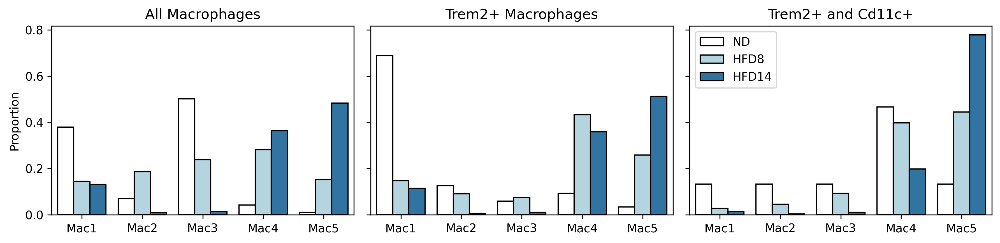

In [7]:
p = pd.melt(res, id_vars=['key', 'Condition'], value_vars=['Mac1','Mac3', 'Mac4', 'Mac2', 'Mac5'])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.facecolor'] = "w"
plt.rcParams['figure.figsize'] = 12, 3

fig, axs = plt.subplots(1, 3, sharey=True)
axs = axs.ravel()


pltLabels = [
    'All Macrophages',
    'Trem2+ Macrophages',
    'Trem2+ and Cd11c+',
]


for i, cond in enumerate(p['Condition'].unique()):
    
    ptemp = p[p['Condition'] == cond]
    ptemp = ptemp.sort_values(by=['key', 'variable'], ascending=[False, True])
    
    sns.barplot(data=ptemp, 
                x='variable', 
                y='value',
                edgecolor='k',
                hue='key', 
                palette=['white', 'lightblue', 'C0'],
                ax=axs[i])
    if i == 2:
        axs[i].legend(loc='upper left')
    else:
        axs[i].legend().remove()
        
    axs[i].set_xlabel("")
    if i == 0:
        axs[i].set_ylabel("Proportion")
    else:
        axs[i].set_ylabel("")
        
    axs[i].set_title(pltLabels[i])

plt.tight_layout()

# Spatial Networks

In [8]:
cardOutDir = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/CARDOuputs/"

dfList = []

for f in os.listdir(cardOutDir):
    if 'macrophage' in f:
        fullPath = f"{cardOutDir}{f}"
        key = f.split("_")[0]
        df = pd.read_csv(fullPath)
        df = df.rename(columns={'Unnamed: 0' : 'spotId'})
        df['key'] = key
        dfList.append(df)

df = pd.concat(dfList, ignore_index=True)
print(f"{df.shape=}")
print(df['key'].value_counts())
print()
df.head()

df.shape=(14836, 13)
HFD8     6782
ND       4068
HFD14    3986
Name: key, dtype: int64



,spotId,Dendritic cells,Mac4,Stromal cells,NK cells,Mac2,Monocytes,T cells,Mac5,Mac3,Mac1,B cells,key
0,AAACAAGTATCTCCCA.1,0.087213,0.113186,0.270488,0.096431,0.057255,0.083130,0.047384,0.163491,0.049659,0.006606,0.025157,HFD8
1,AAACACCAATAACTGC.1,0.159247,0.129071,0.105884,0.002606,0.084753,0.088446,0.016601,0.302068,0.046115,0.038813,0.026395,HFD8
2,AAACAGCTTTCAGAAG.1,0.042437,0.128286,0.329050,0.064440,0.050805,0.049080,0.052493,0.100578,0.065773,0.025274,0.091783,HFD8
3,AAACAGGGTCTATATT.1,0.038153,0.094966,0.294255,0.055503,0.061959,0.060107,0.048176,0.127678,0.099188,0.040547,0.079468,HFD8
4,AAACAGTGTTCCTGGG.1,0.000020,0.256841,0.323585,0.003329,0.015668,0.010229,0.002518,0.222850,0.000587,0.000737,0.163636,HFD8


In [9]:
sptDir =  "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/CARDInputs/"

spt = {}

for f in os.listdir(sptDir):
    if "spt" in f and "macrophage" in f:
        print(f)
        fullPath = f"{sptDir}{f}"
        key = f.split("_")[0]
        sdf = pd.read_csv(fullPath)
        sdf = sdf.rename(columns={'Unnamed: 0' : 'gene'})
        sdf = sdf.set_index('gene')
        sdf = sdf.T
        sdf.index = sdf.index.str.replace("-", ".")
        spt[key] = sdf
    
print('done')

HFD8_macrophage_spt.csv
HFD14_macrophage_spt.csv
ND_macrophage_spt.csv
done


In [10]:
coordDir = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/CARDInputs/"

dfList = []

for f in os.listdir(coordDir):
    if "coord" in f:
        fullPath = f"{coordDir}{f}"
        key = f.split("_")[0]
        cdf = pd.read_csv(fullPath)
        cdf = cdf.rename(columns={'Unnamed: 0' : 'spotId'})
        cdf['key'] = key
        dfList.append(cdf)

cdf = pd.concat(dfList, ignore_index=True)
print(f"{cdf.shape=}")
print(cdf['key'].value_counts())
print()
cdf.head()

cdf.shape=(14848, 4)
HFD8     6788
ND       4072
HFD14    3988
Name: key, dtype: int64



,spotId,x,y,key
0,AAACATTTCCCGGATT.1,1139.783401,1365.804581,HFD14
1,AAACCGGGTAGGTACC.1,468.056902,1045.415505,HFD14
2,AAACCGTTCGTCCAGG.1,604.524374,1214.452428,HFD14
3,AAACCTAAGCAGCCGG.1,1003.708924,1433.743571,HFD14
4,AAACCTCATGAAGTTG.1,380.369919,960.970730,HFD14


In [11]:
"""Merge CARD predictions with spatial coordinates"""
df = pd.merge(cdf, df,
              how='left', 
              left_on=['spotId', 'key'],
              right_on=['spotId', 'key'])

df = df.fillna(0)
df = df.drop_duplicates() # very important!
print(df['key'].value_counts())
df.head()

HFD8     3394
ND       2036
HFD14    1994
Name: key, dtype: int64


,spotId,x,y,key,Dendritic cells,Mac4,Stromal cells,NK cells,Mac2,Monocytes,T cells,Mac5,Mac3,Mac1,B cells
0,AAACATTTCCCGGATT.1,1139.783401,1365.804581,HFD14,3.468007e-02,0.007548,0.409201,0.170860,0.004757,0.041542,0.055275,0.219997,0.010912,0.004188,0.041040
2,AAACCGGGTAGGTACC.1,468.056902,1045.415505,HFD14,1.280364e-03,0.088368,0.187514,0.019633,0.028867,0.129969,0.040070,0.450618,0.008903,0.013757,0.031021
4,AAACCGTTCGTCCAGG.1,604.524374,1214.452428,HFD14,3.752028e-04,0.004256,0.283055,0.187004,0.021560,0.108340,0.044845,0.310869,0.003200,0.004016,0.032480
6,AAACCTAAGCAGCCGG.1,1003.708924,1433.743571,HFD14,1.198581e-07,0.009084,0.239973,0.043516,0.004948,0.057287,0.052469,0.558332,0.000064,0.023214,0.011113
8,AAACCTCATGAAGTTG.1,380.369919,960.970730,HFD14,1.377525e-02,0.029749,0.216199,0.122802,0.053188,0.158933,0.041466,0.234411,0.043126,0.037127,0.049224


In [12]:
def closest_node(node, nodes, metric):
    closest_index = distance.cdist([node], nodes, metric=metric).argmin()
    return closest_index

def getGraph(kdf, x, y, n=300, metric='minkowski', return_center=True):
    """A function to generate a graph of size n x x
    around point (x, y) """
    
    nodes = kdf[['x', 'y']]
    centerInd = closest_node([x, y], nodes, metric)
    
      
    # get the n points around that node
    nbrs = NearestNeighbors(n_neighbors=n,  
                            metric=metric, 
                            algorithm='ball_tree').fit(nodes)
    distances, indices = nbrs.kneighbors(nodes)
    
    # create the subgraph
    windowIndices = indices[centerInd]
    mask = kdf.index.isin(windowIndices)
    
    center = kdf[mask].reset_index(drop=True)
    dists = sklearn.metrics.pairwise_distances(center[['x', 'y']], metric=metric)
    
    X = dists
    
    # create the graph
    nodeMapper = dict(zip(center.index, center['spotId']))
    G = nx.from_numpy_array(X)
    G = nx.relabel_nodes(G, nodeMapper)
    
    # set positions
    pos = {}
    for idx, row in center.iterrows():
        pos[row['spotId']] = np.array(row[['x', 'y']])
    
    G.pos = pos
    
    if return_center:
        return G, center
    else:
        return G

In [13]:
keys = ['ND', 'HFD8', 'HFD14']
graph = {}
meta = {}

n = 300

for i, key in enumerate(keys):
    kdf = df[df['key'] == key].reset_index(drop=True)
    # get the center node index
    x = kdf['x'].mean()
    y = kdf['y'].mean()
    
    G, mf = getGraph(kdf, x, y, n)
    graph[key] = G
    meta[key] = mf
    
print('done')

done


==== ND ====
	Density: 0.0000
	Number of nodes in largest cc: 1.0000 (0.0033)
==== HFD8 ====
	Density: 0.0011
	Number of nodes in largest cc: 9.0000 (0.0300)
==== HFD14 ====
	Density: 0.0050
	Number of nodes in largest cc: 109.0000 (0.3633)


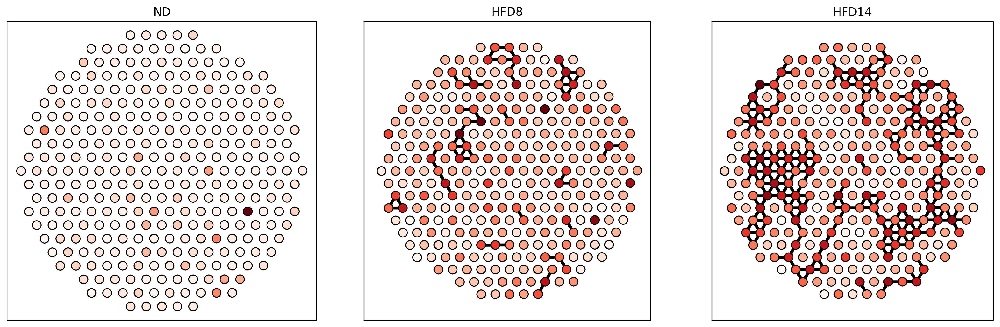

In [14]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.facecolor'] = "w"
plt.rcParams['figure.figsize'] = 15, 4.8

fig, axs = plt.subplots(1, 3)
axs = axs.ravel()

pway = {}

plotBox = 400
radius = 25
cmap = 'Reds'
t = 0.5

for i, key in enumerate(keys):
    
    G = graph[key]
    mf = meta[key]

    mf['norm'] = mf['Mac5'] / mf['Mac5'].max()
    # mf['norm'] = ((mf['Mac5'] / mf['Mac5'].max())  +  (mf['Mac4'] / mf['Mac4'].max())) /2 # both mac4 and mac5
    
    node_attr = mf.set_index('spotId').to_dict('index')
    
    nx.set_node_attributes(G, node_attr)    

    colors = list(nx.get_node_attributes(G, 'norm').values())
    nx.draw_networkx_nodes(G,
                           pos=G.pos,
                           node_size=80,
                           node_color=colors,
                           cmap=cmap,
                           vmin=0,
                           vmax=1,
                           edgecolors='k',
                           linewidths=1,
                           ax=axs[i])
    
    edgelist = []
    for u,v,e in G.edges(data=True):
        if e['weight'] < radius:
            
            x1 = G.nodes[u]['norm']
            x2 = G.nodes[v]['norm']
            
            if scipy.stats.hmean([x1, x2]) > t:
                edgelist.append((u, v))

    nx.draw_networkx_edges(G,
                           pos=G.pos,
                           width=3,
                           edge_color='k',
                           edgelist=edgelist,
                           ax=axs[i])     
    
    axs[i].set_title(key)
    axs[i].set_aspect('equal')
    axs[i].invert_yaxis()
    
#     # add colorbar
#     if i == 2:
#         norm = plt.Normalize(0,1)
#         sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
#         sm.set_array([])
#         cbar = plt.colorbar(sm, 
#                      ax=axs[i], 
#                      shrink = 0.25,
#                      anchor=(0.8, 1))
        
#         cbar.ax.set_yticklabels([])
#         cbar.ax.set_yticks([])
#         cbar.ax.set_title("High", fontsize=10)
#         cbar.ax.set_xlabel("Low", fontsize=10)
        
    """ Evaluate the subgraph """
    H = nx.Graph()
    H.add_nodes_from(G.nodes())
    H.add_edges_from(edgelist)
    H.pos = G.pos
    pway[key] = H
    
    # largest connected component
    components = sorted(nx.connected_components(H), key=len, reverse=True)
    cc = G.subgraph(components[0])
    
    print(f"==== {key} ====")
    print(f"\tDensity: {nx.density(H):.4f}")
    nH = nx.number_of_nodes(cc)
    nG = nx.number_of_nodes(G)
    print(f"\tNumber of nodes in largest cc: {nH:.4f} ({nH/nG:.4f})")
    
plt.tight_layout()

In [15]:
# break

,spotId,degree_centrality,betweenness_centrality,closeness_centrality,harmonic_centrality,key
0,AAACTGCTGGCTCCAA.1,0.0,0.0,0.0,0.0,ND
1,AAATACCTATAAGCAT.1,0.0,0.0,0.0,0.0,ND
2,AAATCGTGTACCACAA.1,0.0,0.0,0.0,0.0,ND
3,AACCTTTAAATACGGT.1,0.0,0.0,0.0,0.0,ND
4,AACGATAATGCCGTAG.1,0.0,0.0,0.0,0.0,ND


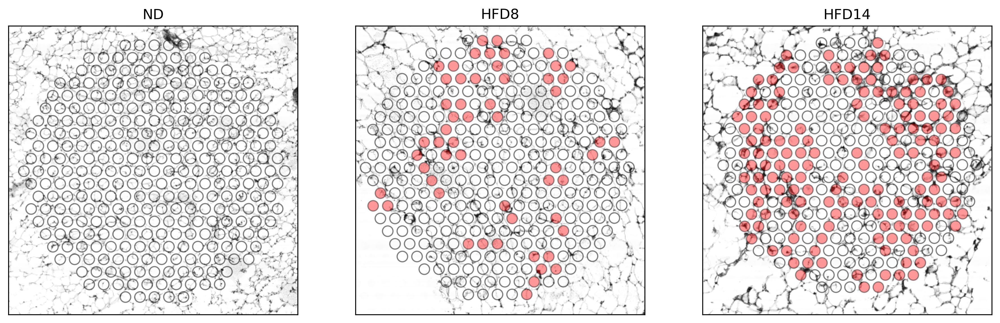

In [16]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.facecolor'] = "w"
plt.rcParams['figure.figsize'] = 15, 5


def getCentralities(G):
    """ function to compute centralities """
    cf = pd.DataFrame({'spotId' : G.nodes()})
    cf['degree_centrality'] = cf['spotId'].map(nx.degree_centrality(G))
    cf['betweenness_centrality'] = cf['spotId'].map(nx.betweenness_centrality(G))
    cf['closeness_centrality'] = cf['spotId'].map(nx.closeness_centrality(G))
    cf['harmonic_centrality'] = cf['spotId'].map(nx.harmonic_centrality(G))
    return cf


fig, axs = plt.subplots(1, 3)
axs = axs.ravel()

plotBox = 400
cmap = 'YlOrRd'

centralities = []

for i, key in enumerate(keys):
    
    G = pway[key]
    cf = getCentralities(G)
    cf['key'] = key
    
    centralities.append(cf)
    
    colors = cf['degree_centrality'].to_list()
    
    mask = (cf['degree_centrality'] > 0)
    connectedNodes = cf[mask]['spotId'].to_list()
    disconnectedNodes = cf[~mask]['spotId'].to_list()
    
    nx.draw_networkx_nodes(G,
                   pos=G.pos,
                   node_size=80,
                   node_color='r',
                   alpha=0.4,
                   nodelist=connectedNodes,
                   edgecolors='k',
                   linewidths=1,
                   ax=axs[i])
    
    nx.draw_networkx_nodes(G,
                       pos=G.pos,
                       node_size=80,
                       node_color='None',
                       alpha=0.5,
                       nodelist=disconnectedNodes,
                       edgecolors='k',
                       linewidths=1,
                       ax=axs[i])
    
    axs[i].set_title(key)
    axs[i].set_aspect('equal')
    axs[i].invert_yaxis()
    
    img = lowres[key]
    
    # # unsharp masking for illumination correction
    # img = unsharp_mask(img, 
    #                    radius=30, 
    #                    amount=0.6)
    axs[i].imshow(img, 
                  cmap='binary_r', 
                  zorder=0)
    
    kdf = df[df['key'] == key].reset_index(drop=True)
    
    # get the center node index
    xMid = kdf['x'].mean()
    yMid = kdf['y'].mean()
    
    xLb = int(xMid - (plotBox / 2))
    xUb = int(xMid + (plotBox / 2))
    
    yLb = int(yMid - (plotBox / 2))
    yUb = int(yMid + (plotBox / 2))

    axs[i].set_ylim([yUb, yLb])
    axs[i].set_xlim([xLb, xUb])    
    axs[i].set_title(key)
    axs[i].set_xticks([])
    axs[i].set_yticks([])


centralities = pd.concat(centralities, ignore_index=True)
centralities.head()

In [17]:
keys = ['ND', 'HFD8', 'HFD14']

lrData = {}

for key in keys:
    sdf = spt[key]
    newCols = {}
    
    for idx, row in lr.iterrows():
        l = row['ligand']
        r = row['receptor']
        
        if l in sdf.columns and r in sdf.columns:
            gMean = scipy.stats.gmean(sdf[[l, r]], axis=1)
            lrName = row['Pair.Name']
            newCols[lrName] = gMean
    
    lrdf = pd.DataFrame(newCols)
    lrdf.index = sdf.index
    
    # remove zero-sum columns 
    lrdf = lrdf.loc[:, (lrdf.sum(axis=0) != 0)]
    print(sdf.shape, lrdf.shape)
    
    lrData[key] = lrdf


print('done')

(2036, 31053) (2036, 124)
(3394, 31053) (3394, 253)
(1994, 31053) (1994, 270)
done


In [18]:
res = []
keys = ['ND', 'HFD8', 'HFD14']

for i, key in enumerate(keys):
    
    lf = lrData[key]
    lrPairs = lf.columns.to_list()
    
    nodes = centralities[centralities['key'] == key]
    mask = (nodes['degree_centrality'] > 0)
    
    connected = nodes[mask]['spotId'].to_list()
    disconnected = nodes[~mask]['spotId'].to_list()
    
    # only perform tests if there is something to test!
    if len(connected) > 0:
        
        mask = lf.index.isin(connected)
        inNet = lf[lf.index.isin(connected)]
        outNet = lf[~lf.index.isin(connected) &  lf.index.isin(nodes['spotId'])]
        
        for lrp in lrPairs:
            score, pval = scipy.stats.ranksums(inNet[lrp], 
                                               outNet[lrp],
                                               alternative='two-sided')
            
            lfc = np.log2(inNet[lrp].mean()+1) - np.log2(outNet[lrp].mean()+1)
                   
            row = {
                'key' : key,
                'lr' : lrp,
                'score' : score,
                'pval' : pval,
                'log2foldchange' : lfc, 
            }
            res.append(row)
            
res = pd.DataFrame(res)
res.head()

,key,lr,score,pval,log2foldchange
0,HFD8,Adgre5-Cd55,0.000000,1.000000,0.000000
1,HFD8,Adipoq-Adipor1,0.000000,1.000000,0.000000
2,HFD8,Adipoq-Adipor2,-0.143482,0.885909,-0.017630
3,HFD8,Apoe-Ldlr,0.208391,0.834924,0.025535
4,HFD8,Apoe-Lrp1,0.526955,0.598225,0.061084


In [19]:
alpha = 0.05

sig = res[res['pval'] < alpha]
sig

,key,lr,score,pval,log2foldchange
290,HFD14,Col1a1-Cd36,2.577099,0.009963,0.806554


In [20]:
lft = 0.2
mask = (res['log2foldchange'] < -lft) | (res['log2foldchange'] > lft)
sig = res[mask].sort_values(by='log2foldchange')
print(f"{sig.shape=}")
sig

sig.shape=(6, 5)


,key,lr,score,pval,log2foldchange
202,HFD8,C3-Cd81,-1.634671,0.102118,-0.420178
437,HFD14,Calr-Lrp1,1.503530,0.132703,0.228034
348,HFD14,Lpl-Lrp1,1.248615,0.211806,0.254821
295,HFD14,Col1a2-Cd36,0.943117,0.345621,0.462982
374,HFD14,Psap-Lrp1,1.840310,0.065723,0.499726
290,HFD14,Col1a1-Cd36,2.577099,0.009963,0.806554


In [21]:
def gauss2d(mu, sigma, size):
    x = np.random.normal(mu, sigma, size)
    y = np.random.normal(mu, sigma, size)
    return (x, y)

In [22]:
# sampling networks 

keys = ['ND', 'HFD8', 'HFD14']

networkSize = 100
nNetworks = 500
edgeThreshold = 0.45 # harmonic mean threshold 
edgeRadius = 25 # distance between spots
sampleSigma = 0.1 # variance around the center of the image

graph = {}
meta = {}
deets = {}

keyInds = np.random.choice(list(range(len(keys))), nNetworks, replace=True)

for i, ki in enumerate(keyInds):
    key = keys[ki]
    kdf = df[df['key'] == key].reset_index(drop=True)
    
    # get sample point
    xDim = kdf['x'].max()
    yDim = kdf['y'].max()
    
    x = xDim // 2
    y = yDim // 2
    
    sx, sy = gauss2d(0, sampleSigma, 1)
    
    sx = (sx[0] * xDim) + x
    sy = (sy[0] * yDim) + y
    
    # generate the graph 
    G, mf = getGraph(kdf, sx, sy, networkSize)
    
    # define the node properties
    mf['norm'] = mf['Mac5'] / mf['Mac5'].max()
    
    node_attr = mf.set_index('spotId').to_dict('index')
    nx.set_node_attributes(G, node_attr)    
    
    # define connections
    edgelist = []
    for u,v,e in G.edges(data=True):
        if e['weight'] < edgeRadius:
            
            x1 = G.nodes[u]['norm']
            x2 = G.nodes[v]['norm']
            
            hmean = scipy.stats.hmean([x1, x2])
            
            if hmean > edgeThreshold:
                edgelist.append((u, v, hmean))

    # build the new graph based on connections
    H = nx.Graph()
    H.add_nodes_from(G.nodes())
    H.add_weighted_edges_from(edgelist)
    H.pos = G.pos 
    
    # add centralities
    cf = getCentralities(H)
    
    node_attr = cf.set_index('spotId').to_dict('index')
    nx.set_node_attributes(H, node_attr)    
    
    mf = pd.merge(mf, cf, 
                  left_on='spotId', 
                  right_on='spotId', 
                  how='left')
    
    graph[i] = H
    meta[i] = mf
    deets[i] = {
        'key' : key,
        'x' : sx,
        'y' : sy,
    }
    
print('done')

done


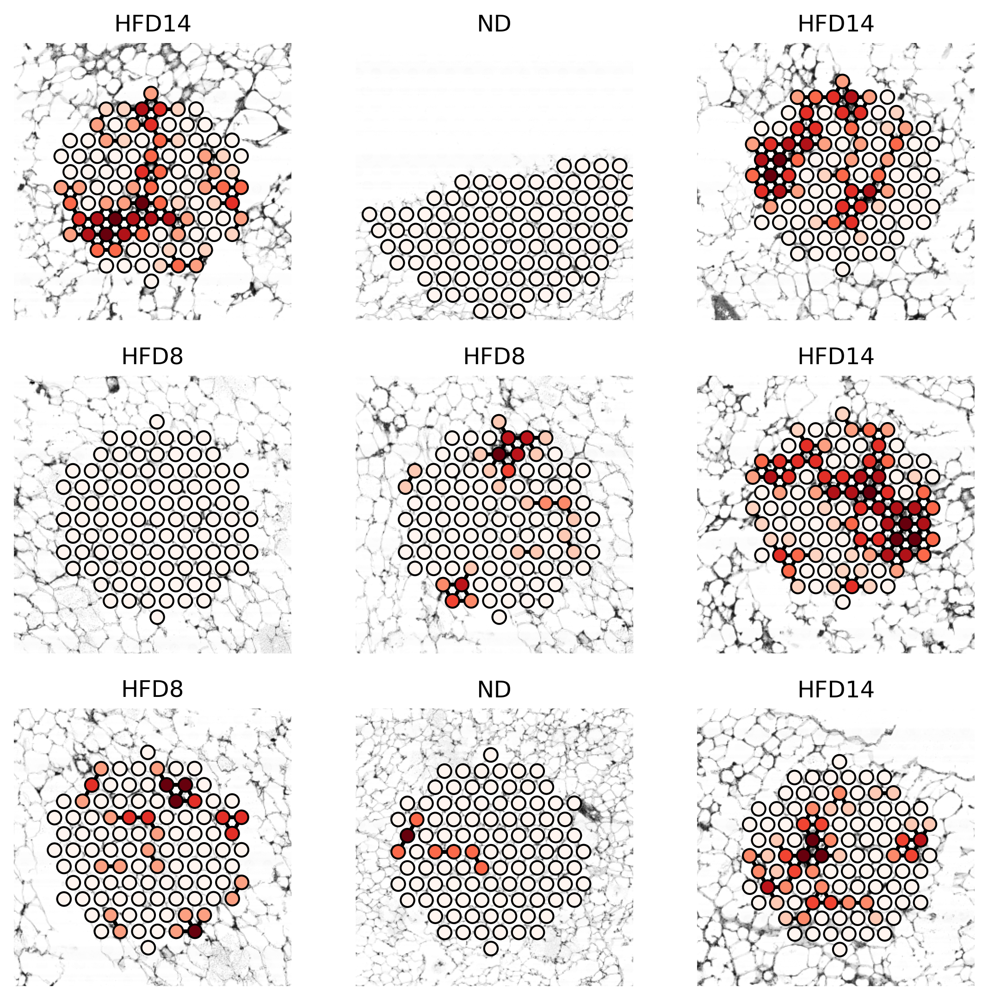

In [23]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.facecolor'] = "w"
plt.rcParams['figure.figsize'] = 9, 9

plotBox = 300

fig, axs = plt.subplots(3, 3)
axs = axs.ravel()

plotI = 0

for i in np.random.choice(list(range(nNetworks)), 9, replace=False):
    key = deets[i]['key']
    G = graph[i]
    mf = meta[i]
    
    node_color = mf['degree_centrality'].to_list()
    
    nx.draw(G, G.pos,
            with_labels=False,
            ax=axs[plotI], 
            node_color=node_color,
            edge_color="k",
            edgecolors='k',
            linewidths=1,
            width=2,
            cmap="Reds",
            node_size=50)
    
    axs[plotI].set_title(key)
    
    
    img = lowres[key]
    axs[plotI].imshow(img, 
                  cmap='binary_r', 
                  zorder=0)
    
    kdf = df[df['key'] == key].reset_index(drop=True)
    
    # get the center node index
    xMid = deets[i]['x']
    yMid = deets[i]['y']
    
    xLb = int(xMid - (plotBox / 2))
    xUb = int(xMid + (plotBox / 2))
    
    yLb = int(yMid - (plotBox / 2))
    yUb = int(yMid + (plotBox / 2))

    axs[plotI].set_ylim([yUb, yLb])
    axs[plotI].set_xlim([xLb, xUb])    
    axs[plotI].set_title(key)
    axs[plotI].set_xticks([])
    axs[plotI].set_yticks([])    
    plotI += 1

Text(0, 0.5, 'Number of Networks')

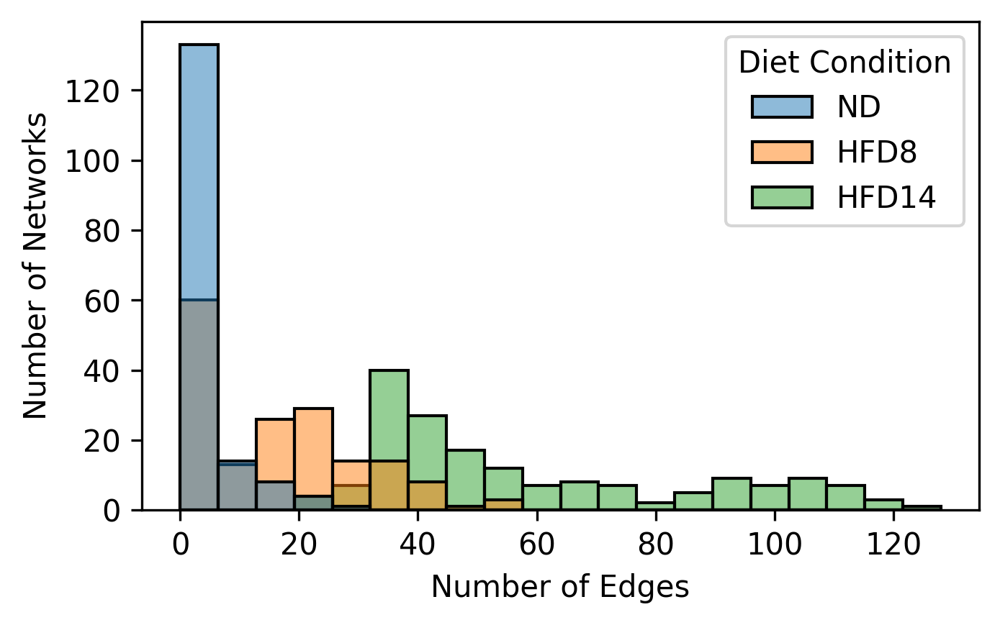

In [24]:
res = []

for i in range(nNetworks):
    key = deets[i]['key']
    G = graph[i]
    
    row = {
        'Diet Condition' : key,
        'nEdges' : len(G.edges())
    }
    
    res.append(row)
    
    
res = pd.DataFrame(res)
res = res.sort_values(by='Diet Condition', ascending=False)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.facecolor'] = "w"
plt.rcParams['figure.figsize'] = 5, 3
sns.histplot(data=res,
             x='nEdges',
             hue='Diet Condition',
             bins=20)

plt.xlabel("Number of Edges")
plt.ylabel("Number of Networks")

In [25]:
res = []

for i in range(nNetworks):
    key = deets[i]['key']
    G = graph[i]
    mf = meta[i]
    
    lf = lrData[key]    
    
    lrPairs = lf.columns.to_list()
    
    mask = (mf['degree_centrality'] > 0) 
    connected += mf[mask]['spotId'].to_list()
    disconnected += mf[~mask]['spotId'].to_list()

    # only perform tests if there is something to test!
    if len(connected) > 0:
        mask = lf.index.isin(connected)
        inNet = lf[lf.index.isin(connected)]
        outNet = lf[~lf.index.isin(connected) &  lf.index.isin(nodes['spotId'])]

        for lrp in lrPairs:
            score, pval = scipy.stats.ranksums(inNet[lrp], 
                                               outNet[lrp],
                                               alternative='two-sided')

            lfc = np.log2(inNet[lrp].mean()+1) - np.log2(outNet[lrp].mean()+1)

            row = {
                'key' : key,
                'lr' : lrp,
                'score' : score,
                'pval' : pval,
                'log2foldchange' : lfc, 
                'nConnected' : len(connected),
                'nDisonnected' : len(disconnected),
                'graphN' : i
            }
            res.append(row)

res = pd.DataFrame(res)
res.head()

,key,lr,score,pval,log2foldchange,nConnected,nDisonnected,graphN
0,HFD8,Adgre5-Cd55,0.000000,1.000000,0.000000,163,237,0
1,HFD8,Adipoq-Adipor1,0.000000,1.000000,0.000000,163,237,0
2,HFD8,Adipoq-Adipor2,0.084808,0.932414,0.007944,163,237,0
3,HFD8,Apoe-Ldlr,-0.102397,0.918441,-0.009650,163,237,0
4,HFD8,Apoe-Lrp1,0.077269,0.938409,0.010670,163,237,0


In [26]:
alpha = 0.05

sig = res[res['pval'] < alpha]
sig

,key,lr,score,pval,log2foldchange,nConnected,nDisonnected,graphN
414,HFD14,Col1a1-Cd36,2.527376,0.011492,0.691956,206,394,2
684,HFD14,Col1a1-Cd36,2.509292,0.012097,0.682490,239,461,3
67700,HFD14,Col1a1-Cd36,2.039060,0.041444,0.616522,7042,24458,311
67970,HFD14,Col1a1-Cd36,2.039060,0.041444,0.616522,7073,24527,312
68364,HFD14,Col1a1-Cd36,2.039060,0.041444,0.616522,7131,24669,314
68634,HFD14,Col1a1-Cd36,2.039060,0.041444,0.616522,7194,24706,315
68904,HFD14,Col1a1-Cd36,2.039060,0.041444,0.616522,7238,24762,316
69680,HFD14,Col1a1-Cd36,2.039060,0.041444,0.616522,7291,25009,319
69950,HFD14,Col1a1-Cd36,2.039060,0.041444,0.616522,7326,25074,320
70344,HFD14,Col1a1-Cd36,2.039060,0.041444,0.616522,7369,25231,322


In [27]:
top = 5

grpd = res.groupby('lr')['log2foldchange'].mean().reset_index()
grpd = grpd.sort_values(by='log2foldchange', ascending=False)

grpd = pd.concat([grpd.head(top), grpd.tail(top)], ignore_index=True)

print(f"{grpd.shape=}")
grpd

grpd.shape=(10, 2)


,lr,log2foldchange
0,Col1a1-Cd36,0.246942
1,Col1a2-Cd36,0.176856
2,Psap-Lrp1,0.121610
3,Apoe-Lrp1,0.065568
4,Calr-Lrp1,0.061769
5,Agrn-Atp1a3,-0.022104
6,Atp1a3-Agrn,-0.022104
7,Cdh5-Cdh5,-0.026141
8,Efnb2-Pecam1,-0.031132
9,Pecam1-Efnb2,-0.031132


# Image analysis

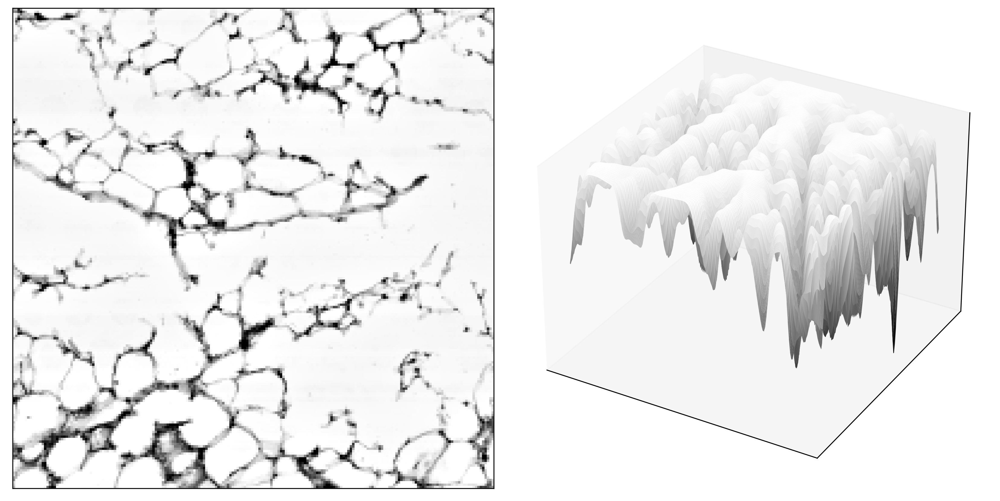

In [57]:
# # downscaling has a "smoothing" effect

# img = lowres['HFD14'][800:1000, 800:1000]

# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.facecolor'] = "w"
# plt.rcParams['figure.figsize'] = 12, 6

# fig = plt.figure(figsize=plt.figaspect(0.5))
# ax = fig.add_subplot(1, 2, 1)

# img1 = skimage.filters.unsharp_mask(img, 
#                                     amount=0.5, 
#                                     radius=10)
# ax.imshow(img1, cmap='gray')
# _ = ax.set_xticks([])
# _ = ax.set_yticks([])

# ax2 = fig.add_subplot(1, 2, 2, projection='3d')

# # create the x and y coordinate arrays (here we just use pixel indices)
# xx, yy = np.mgrid[0:img.shape[0], 0:img.shape[1]]

# # tck = interpolate.bisplrep(xx, yy, img, s=0)
# # znew = interpolate.bisplev(xx[:,0], yy[0,:], tck)

# # smooth the image
# img = skimage.filters.gaussian(img, sigma=3)

# ax2.plot_surface(xx, 
#                  yy, 
#                  img,
#                  rstride=1, 
#                  cstride=2, 
#                  cmap=plt.cm.gray,
#                  linewidth=0)

# _ = ax2.set_xticks([])
# _ = ax2.set_yticks([])
# _ = ax2.set_zticks([])

# # ax2.view_init(120, 30)/


# plt.tight_layout()

In [29]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

In [ ]:
img = lowres['HFD14']

nClasses = 4
thresholds = skimage.filters.threshold_multiotsu(img, classes=nClasses)
# Using the threshold values, we generate the three regions.
regions = np.digitize(img, bins=thresholds)
training_labels = np.where((regions == 0) | (regions == 1), 1, regions) 
# training_labels = np.where(regions == 4, 

sigma_min = 1
sigma_max = 16
features_func = partial(feature.multiscale_basic_features,
                        intensity=True, edges=False, texture=True,
                        sigma_min=sigma_min, sigma_max=sigma_max) 
                        # channel_axis=-1)

features = features_func(img)
clf = RandomForestClassifier(n_estimators=50, n_jobs=-1,
                             max_depth=10, max_samples=0.05)
clf = future.fit_segmenter(training_labels, features, clf)
result = future.predict_segmenter(features, clf)

### run the random forest on all images
segment = {}


for i, key in enumerate(keys):
    img = lowres[key]
    features = features_func(img)
    result = future.predict_segmenter(features, clf)
    segment[key] = result
    
    
print('done')

In [ ]:
keys = ['ND', 'HFD8', 'HFD14']
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.facecolor'] = "w"
plt.rcParams['figure.figsize'] = 15, 5

plotBox = 500
ws = 10 # size of the square box around each spot center

fig, axs = plt.subplots(1, 3)
axs = axs.ravel()

radius = 45
cmap = mpl.colors.ListedColormap(["r", "k", "w"])
t = 0.005
g1 = 'Trem2'
g2 = 'Cd68'

for i, key in enumerate(keys):
    
    G = pway[key]
    mf = meta[key]
    sdf = spt[key]
    seg = segment[key]
    simg = seg.copy()
    
    # add centrlity to graph
    cf = getCentralities(G)
    node_attr = cf.set_index('spotId').to_dict('index')
    nx.set_node_attributes(G, node_attr)
    

    # filter the window
    sdf = sdf[sdf.index.isin(mf['spotId'])]
    sdf = sdf.reindex(mf['spotId'])
    
    res = []
    
    for n in G.nodes():            
        x, y = G.pos[n]
            
        # define the window around the spot
        xLb = int(x) - ws
        xUb = int(x) + ws   
        yLb = int(y) - ws   
        yUb = int(y) + ws
        
        # extract the window
        win = simg[yLb:yUb, xLb:xUb]
        
        
        row = {}
        
        for k, v in Counter(list(win.ravel())).items():
            row[f'Label {k}'] = v / win.size
    
        for attr, val in G.nodes[n].items():
            row[attr] = val
        res.append(row)
        
    res = pd.DataFrame(res)
    res['nType'] = np.where(res['degree_centrality'] > 0, 'Connected', 'Disconnected')
    res = pd.melt(res, id_vars=['nType'], value_vars=['Label 1', 'Label 2', 'Label 3'])

    
    sns.boxplot(data=res, 
                y='value', 
                x='variable',
                hue='nType',
                showfliers=False,
                palette=['lightgrey', 'lightcoral'],
                ax=axs[i])

    axs[i].set_title(key)
    axs[i].set_xlabel("")
    
    if i == 2:
        axs[i].legend(loc='upper left')
    else:
        axs[i].legend().remove()
        
    if i == 0:
        axs[i].set_ylabel("Proportion of Windows")
    else:
        axs[i].set_ylabel("")
    
    
plt.tight_layout()    
plt.show()

In [ ]:
# cTypes = ['Dendritic cells', 
#           'Mac4', 
#           'Stromal cells',
#           'NK cells',
#           'Mac2', 
#           'Monocytes',
#           'T cells',
#           'Mac5',
#           'Mac3', 
#           'Mac1',
#           'B cells']

# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.facecolor'] = "w"
# plt.rcParams['figure.figsize'] = 12, 3


# fig, axs = plt.subplots(1, 3, sharey=True)
# axs = axs.ravel()

# for i, key in enumerate(keys):
#     mf = meta[key]
#     sdf = spt[key]
    
    
#     # centralities
#     cf = res[res['key'] == key]
#     mask = cf['degree_centrality'] > 0
#     spotIds = cf[mask]['spotId'].to_list()
#     otherIds = cf[~mask]['spotId'].to_list()
    
#     # cellType analysis
#     inGroup = mf[mf['spotId'].isin(spotIds)]
#     outGroup = mf[mf['spotId'].isin(otherIds)]
    
#     newRows = []
    
#     for ctype in sorted(cTypes):
#         meanGroup = inGroup[ctype].mean()
#         meanOther = outGroup[ctype].mean()
#         lfc = np.log2(meanGroup) - np.log2(meanOther)
        
#         row = {
#             'cellType' : ctype,
#             'meanGroup' : meanGroup,
#             'meanOther' : meanOther,
#             "lfc" : lfc,
#         }
        
#         newRows.append(row)
    
#     r = pd.DataFrame(newRows)
#     r = r.sort_values(by='cellType')
#     r['color'] = np.where(r['lfc'] > 0, 0, 1)
    
#     # print(r)
#     # break
    
#     sns.barplot(data=r,
#                 y='cellType', 
#                 x='lfc',
#                 hue=r['color'].to_list(),
#                 palette=['#298510', '#d62418'],
#                 edgecolor='k',
#                 zorder=2,
#                 dodge=False,
#                 ax=axs[i])

#     axs[i].legend_.remove()
    
#     handles = [
#         mpatches.Patch(color='#298510',
#                        ec='k', 
#                        label='In Network'),
#         mpatches.Patch(color='#d62418',
#                        ec='k', 
#                        label='Out of Network'),
#     ]
    
    
#     if i == 2:
#         axs[i].legend(handles=handles, bbox_to_anchor=(1, .78))
    
    
#     axs[i].set_xlabel("")
#     axs[i].set_xlabel("Log Fold Change")
        
#     axs[i].set_ylabel("")
#     axs[i].grid(True, zorder=1)
#     axs[i].set_title(key)
    
    
# plt.tight_layout()